In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import glob
import cv2
import os
from sklearn.model_selection import GridSearchCV
from skimage.feature import hog 
from google.colab.patches import cv2_imshow
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report




In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

# upload zipped data into the main root of your gdrive and run the following just ONCE
# !unzip '/content/drive/MyDrive/Colab Notebooks/dataset-p2.zip'
!unzip '/content/drive/MyDrive/dataset-p2.zip'


Streaming output truncated to the last 5000 lines.
  inflating: dataset_v4/images/cars/640.jpg  
  inflating: dataset_v4/images/cars/641.jpg  
  inflating: dataset_v4/images/cars/642.jpg  
  inflating: dataset_v4/images/cars/643.jpg  
  inflating: dataset_v4/images/cars/644.jpg  
  inflating: dataset_v4/images/cars/645.jpg  
  inflating: dataset_v4/images/cars/646.jpg  
  inflating: dataset_v4/images/cars/647.jpg  
  inflating: dataset_v4/images/cars/648.jpg  
  inflating: dataset_v4/images/cars/649.jpg  
  inflating: dataset_v4/images/cars/65.jpg  
  inflating: dataset_v4/images/cars/650.jpg  
  inflating: dataset_v4/images/cars/651.jpg  
  inflating: dataset_v4/images/cars/652.jpg  
  inflating: dataset_v4/images/cars/653.jpg  
  inflating: dataset_v4/images/cars/654.jpg  
  inflating: dataset_v4/images/cars/655.jpg  
  inflating: dataset_v4/images/cars/656.jpg  
  inflating: dataset_v4/images/cars/657.jpg  
  inflating: dataset_v4/images/cars/658.jpg  
  inflating: dataset_v4/images

In [ ]:
car_path = "/content/dataset-p3/dataset_v4/images/cars"
motorcycles_path = "/content/dataset-p3/dataset_v4/images/motorcycles"
non_vehicle_path = "/content/dataset-p3/dataset_v4/images/non-vehicles"
data_path = "/content/dataset-p3/dataset_v4/images/"
vid_1_path = "/content/dataset-p3/dataset_v4/sample videos/sample.mp4"
vid_2_path = "/content/dataset-p3/dataset_v4/sample videos/sample_2.mp4"

In [ ]:
data_features = []

car_img_data = []
motorcycles_img_data = []
non_vehicles_img_data = []

data_labels = [] 
shapes = []
 

for label in ["cars", "motorcycles", "non-vehicles"]:

  folder_path = "/content/dataset-p3/dataset_v4/images/"+label

  for image_name in os.listdir(folder_path):

    img_path = data_path+label+"/"+image_name
    img=np.array(cv2.imread(img_path))



    dim = (75,75)
    resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)

    data_features.append(resized)
    data_labels.append(label)
    if label == "cars":
      car_img_data.append(resized)
    if label == "motorcycles":
      motorcycles_img_data.append(resized)
    if label == "non-vehicles":
      non_vehicles_img_data.append(resized)

print("data loaded")
# data_labels


data loaded


#Support Vector Machines (SVM)

Histogram of Gradients (HOG)

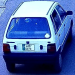

(75, 75, 3)


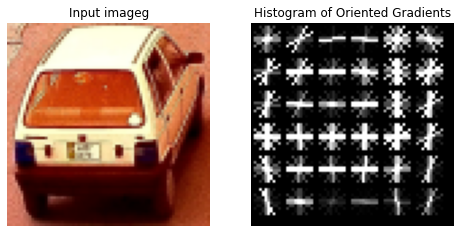

In [ ]:
from skimage import data, exposure

cv2_imshow(data_features[0])
print(data_features[0].shape)

# not flattened
# not normalized
# not grey scaled



imageg = data_features[0]


# visualization
fd, hog_imageg = hog(data_features[0], orientations=8, pixels_per_cell=(12, 12), cells_per_block=(1, 1), visualize=True)


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)

ax1.axis('off')
ax1.imshow(imageg, cmap=plt.cm.gray)
ax1.set_title('Input imageg')

# Rescale histogram for better display
hog_imageg_rescaled = exposure.rescale_intensity(hog_imageg, in_range=(0, 10))

ax2.axis('off')
ax2.imshow(hog_imageg_rescaled, cmap=plt.cm.gray)
ax2.set_title('Histogram of Oriented Gradients')
plt.show()




In [ ]:
#actual work
# for everyimage in vehicle:

def extract_hog(img):
  hog_features = []

  #for channel in range(3):
  hog_imageg = hog(img, orientations=8, pixels_per_cell=(10, 10), cells_per_block=(1, 1), visualize=False)
  hog_features.extend(hog_imageg)

  return hog_features


hog1 = np.array(extract_hog(data_features[0]))


Scale-invariant feature transform (SIFT)

In [ ]:
# !pip install scikit-image==0.19.2.
from skimage.color import rgb2gray
# from skimage.feature import match_descriptors, plot_matches, SIFT
from skimage import data, exposure


img1 = data.astronaut()


def extract_sift(img):
  img = rgb2gray(img)
  descriptor_extractor = SIFT()
  descriptor_extractor.detect_and_extract(img)
  descriptors = descriptor_extractor.descriptors
  return descriptors.flatten()




Spatial Binning


In [ ]:
def extract_bin_spatial(image,spatial_size=(18,18)):
    features = cv2.resize(image, spatial_size).ravel() 
    return features

spacial_feature = extract_bin_spatial(data_features[0])

Color Histogram

In [ ]:
def extract_color_hist(image):
    channel1_hist = np.histogram(image[:,:,0], bins=32, range=(0, 256))
    channel2_hist = np.histogram(image[:,:,1], bins=32, range=(0, 256))
    channel3_hist = np.histogram(image[:,:,2], bins=32, range=(0, 256))


    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    return hist_features

In [ ]:
# function to create master feature dataset

# returns features of all images (every row is a concat of all 4 features of 1 image)


def get_features(images):
  # breaker = 0
  all_images_features = []
  for img in images:
    # breaker = breaker + 1
    # if breaker == 200:
    #   break
    
    image_features = []

    hog_data = extract_hog(img)
    image_features.append(hog_data)

    spacial_data = extract_bin_spatial(img)
    image_features.append(spacial_data)

    color_data = extract_color_hist(img)
    image_features.append(color_data)

    sift_data = extract_sift(img)
    image_features.append(sift_data)

    # print(breaker)
    all_images_features.append(np.concatenate(image_features))
  return all_images_features

car_features = get_features(car_img_data)
motorcycle_features = get_features(motorcycles_img_data)
non_features = get_features(non_vehicles_img_data)





In [ ]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import LinearSVC
from sklearn.model_selection import train_test_split
                            
X = np.vstack((car_features, motorcycle_features, non_features)).astype(np.float64)

k = int(len(car_features))



l = int(len(motorcycle_features)) 



m = int(len(non_features))



y = np.hstack((np.zeros(k),np.ones(l), np.full(m,2)))


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

Principle Component Analysis (PCA)

In [ ]:
#Dimensionality reduction using PCA
pca = PCA()
reduced_X_train = pca.fit_transform(X_train)
reduced_X_test = pca.transform(X_test)

Tuning Hyperparameters 

In [ ]:

param_grid = {'C': [0.1, 1, 10, 100, 1000],
              'max_iter': [100000],
              'dual': [True]}
 
grid = GridSearchCV(LinearSVC(), param_grid, refit = True, verbose = 3)
 
#fitting the model for grid search
grid.fit(X_train, y_train)

print(grid.best_params_)


Training OnevsAll SVM

In [ ]:

# Create the SVM using the best hyperparameters found from the tuning code
svm = LinearSVC(C=0.1, max_iter=100000, dual = True)
# Make it an OvR classifier
ovr_classifier = OneVsRestClassifier(svm)

# Fit the data to the OvR classifier
ovr_classifier = ovr_classifier.fit(reduced_X_train, y_train)
print(ovr_classifier.score(reduced_X_test, y_test))


SVM Evaluation

In [ ]:
#Classification report for evaluation
class_names = ["cars", "motorcycles", "non-vehicles"]
print(classification_report(y_test, ovr_classifier.predict(reduced_X_test), target_names=class_names))

              precision    recall  f1-score   support

        cars       0.98      0.90      0.94      1175
 motorcycles       0.87      0.94      0.90       643
non-vehicles       0.95      1.00      0.97       855

    accuracy                           0.94      2673
   macro avg       0.93      0.95      0.94      2673
weighted avg       0.94      0.94      0.94      2673



#Neural Network

In [ ]:
import glob
import cv2
import os
from sklearn.model_selection import GridSearchCV
from torch.utils.data import DataLoader
import torch
from torch import nn
from google.colab import drive
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score
class_names = ["cars", "motorcycles", "non-vehicles"]


In [ ]:
data_path = "/content/dataset_v4/images/"
data_features = []
data_labels = [] 

for label in ["cars", "motorcycles", "non-vehicles"]:

  folder_path = "/content/dataset_v4/images/"+label

  for image_name in os.listdir(folder_path):

    img_path = data_path+label+"/"+image_name
    img=np.array(cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB))

    dim = (32,32)
    resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
    
    res_arr  = resized/255

    # res_arr = res_arr.flatten()


    data_features.append(res_arr)
    data_labels.append(label)



print("data loaded")


data loaded


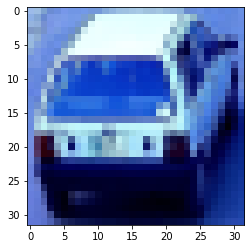

In [ ]:
plt.imshow(data_features[0])


In [ ]:
data_set = []
X = []
Y = []
labels = {"cars":1, "motorcycles":2, "non-vehicles":0}
print(data_features[1][0].shape)
for i in range(len(data_features)):
  data_set.append((data_features[i].flatten(), labels[data_labels[i]]))
  # X.append(data_features[i].flatten())
  # Y.append(labels[data_labels[i]])

np.random.shuffle(data_set)

train_len = int(0.7*len(data_set))
test_len = len(data_set)-train_len
print(train_len, test_len)
X_train = []
X_test = []
Y_train = []
Y_test = []
for i in range(len(data_set)):
  if i < train_len:
    X_train.append(data_set[i][0])
    Y_train.append(data_set[i][1])
  else:
    X_test.append(data_set[i][0])
    Y_test.append(data_set[i][1])

(32, 3)
5670 2430


In [ ]:
nn = MLPClassifier(solver='adam', alpha=1e-5,
                    hidden_layer_sizes=(100,10, 3), random_state=1)

Fitting NN 

In [ ]:
nn.fit(X_train, Y_train)

MLPClassifier(alpha=1e-05, hidden_layer_sizes=(100, 10, 3), random_state=1)

NN Evaluation


In [ ]:
accuracy_score(Y_test, nn.predict(X_test))*100
# print(nn.predict(X_test[0:1]))

98.31483764899302

In [ ]:
from sklearn.metrics import classification_report
class_names = ["non-vehicles","cars", "motorcycles"]
print(classification_report(Y_test, nn.predict(X_test), target_names=class_names))

              precision    recall  f1-score   support

non-vehicles       0.97      1.00      0.98       795
        cars       0.99      0.95      0.97      1044
 motorcycles       0.95      0.97      0.96       591

    accuracy                           0.97      2430
   macro avg       0.97      0.97      0.97      2430
weighted avg       0.97      0.97      0.97      2430



# Naieve Bayes

In [ ]:
from sklearn.naive_bayes import MultinomialNB

In [ ]:
clf = MultinomialNB()
clf.fit(X_train, Y_train)

MultinomialNB()

In [ ]:
y_pred = clf.predict(X_test)

In [ ]:
accuracy_score(Y_test, y_pred)*100

89.67078189300412

In [ ]:
print(classification_report(Y_test, y_pred, target_names=class_names))

              precision    recall  f1-score   support

        cars       0.84      0.98      0.90       760
 motorcycles       0.98      0.85      0.91      1082
non-vehicles       0.85      0.88      0.86       588

    accuracy                           0.90      2430
   macro avg       0.89      0.90      0.89      2430
weighted avg       0.91      0.90      0.90      2430



# Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression


In [ ]:
clf = LogisticRegression(penalty='none', 
                         tol=0.1, solver='saga',
                         multi_class='multinomial').fit(X_train, Y_train)


In [ ]:
y_pred = clf.predict(X_test)
accuracy_score(Y_test, y_pred)*100

93.78600823045268

In [ ]:
print(classification_report(Y_test, y_pred, target_names=class_names))

              precision    recall  f1-score   support

        cars       0.89      0.99      0.94       760
 motorcycles       0.97      0.93      0.95      1082
non-vehicles       0.95      0.88      0.92       588

    accuracy                           0.94      2430
   macro avg       0.94      0.93      0.93      2430
weighted avg       0.94      0.94      0.94      2430



#Sliding Window

In [ ]:
import cv2
vidcap = cv2.VideoCapture(vid_1_path)
success,image = vidcap.read()
count = 0

video_frames = []

while success:
  # cv2.imwrite("frame%d.jpg" % count, image)     # save frame as JPEG file      
  success,image = vidcap.read()
  # print('Read a new frame: ', success)
  video_frames.append(image)
  count += 1




In [ ]:
vidcap_2 = cv2.VideoCapture(vid_2_path)
success_2,image_2 = vidcap_2.read()
count = 0

video_frames_2 = []

while success_2:
  # cv2.imwrite("frame%d.jpg" % count, image_2)     # save frame as JPEG file      
  success_2,image_2 = vidcap_2.read()
  # print('Read a new frame: ', success_2)
  video_frames_2.append(image_2)
  count += 1



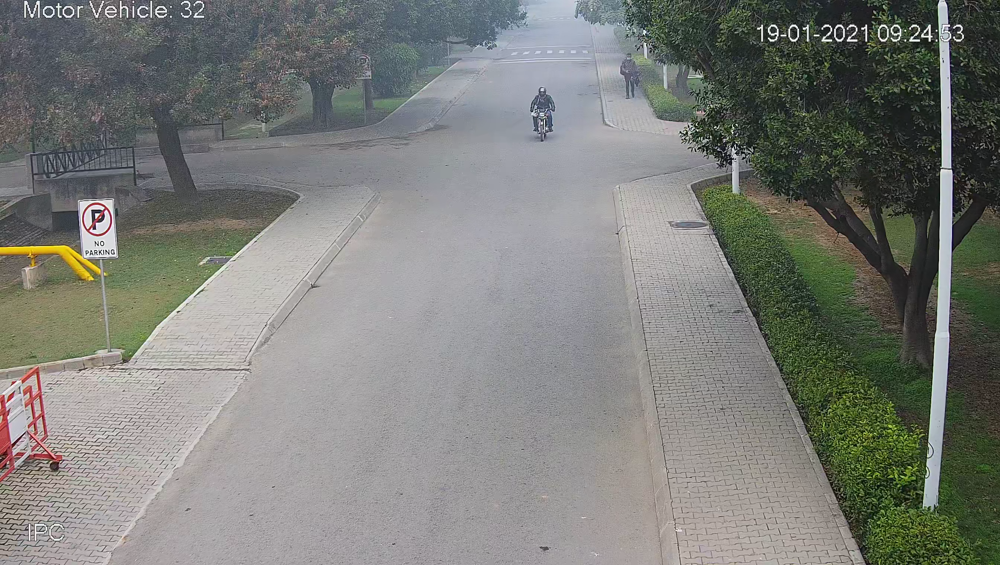

In [ ]:
cv2_imshow(video_frames_2[0])

In [ ]:
#(1520, 2688, 3)
print(video_frames_2[0].shape)

(1520, 2688, 3)


In [ ]:
import os

print(os.getcwd())

/content


In [ ]:
# !pip install slidingwindow

import slidingwindow as sw

windows = sw.generate(video_frames[0], sw.DimOrder.HeightWidthChannel, 256, 0.5)
# display(windows)


In [ ]:
try:
  counter = 0
  for image in video_frames:
    counter+=1
    # print(counter)
    windows = sw.generate(image, sw.DimOrder.HeightWidthChannel, 256, 0.5)

    resized_windows_coordinates = []
    resized_window_img_to_predict = []
    resized_window_img = []

    for window in windows:
      window = window.getRect()
      resized_windows_coordinates.append(window)
      
      x = window[0]
      y = window[1] 
      h = window[2]
      w = window[3]

      crop_img = image[y:y+h, x:x+w]
      # cv2_imshow(crop_img)
      cv2.waitKey(0)
      # resize 
      dim = (32,32)
      resized = cv2.resize(crop_img, dim, interpolation = cv2.INTER_AREA)

      resized_window_img.append(resized)
      res_arr  = resized/255
      resized = res_arr.flatten()
      resized_window_img_to_predict.append(resized)

    predictions = nn.predict(resized_window_img_to_predict)

    for i in range(len(predictions)):
      window_with_car = resized_windows_coordinates[i]
      x = window_with_car[0]
      y = window_with_car[1] 
      h = window_with_car[2]
      w = window_with_car[3]
      if predictions[i] == 1 and x>=512 and x<=1408:# car
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(image,'Car',(x,y), font, 1,(255,255,255),2,cv2.LINE_AA) 
        cv2.rectangle(image,(x,y),(x+w,y+h),(0,256,0),3)

except:
  print("An exception occurred") 


    



An exception occurred


In [ ]:
try:
  counter = 0
  for image in video_frames_2:
    counter+=1
    # print(counter)
    windows = sw.generate(image, sw.DimOrder.HeightWidthChannel, 256, 0.5)

    resized_windows_coordinates_2 = []
    resized_window_img_to_predict_2 = []
    resized_window_img_2 = []

    for window in windows:
      window = window.getRect()
      resized_windows_coordinates_2.append(window)
      
      x = window[0]
      y = window[1] 
      h = window[2]
      w = window[3]

      crop_img = image[y:y+h, x:x+w]
      cv2.waitKey(0)
      # resize 
      dim = (32,32)
      resized = cv2.resize(crop_img, dim, interpolation = cv2.INTER_AREA)
      resized_window_img_2.append(resized)

      res_arr  = resized/255
      resized = res_arr.flatten()
      resized_window_img_to_predict_2.append(resized)

    predictions = nn.predict(resized_window_img_to_predict_2)

    for i in range(len(predictions)):
      window_with_bike = resized_windows_coordinates_2[i]
      x = window_with_bike[0]
      y = window_with_bike[1] 
      h = window_with_bike[2]
      w = window_with_bike[3]
      if predictions[i] == 2 and x>=512 and x<=1408:# bike
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(image,'Bike',(x,y), font, 1,(255,255,255),2,cv2.LINE_AA) 
        cv2.rectangle(image,(x,y),(x+w,y+h),(0,256,0),3)
except:
  print("An exception occurred") 


An exception occurred


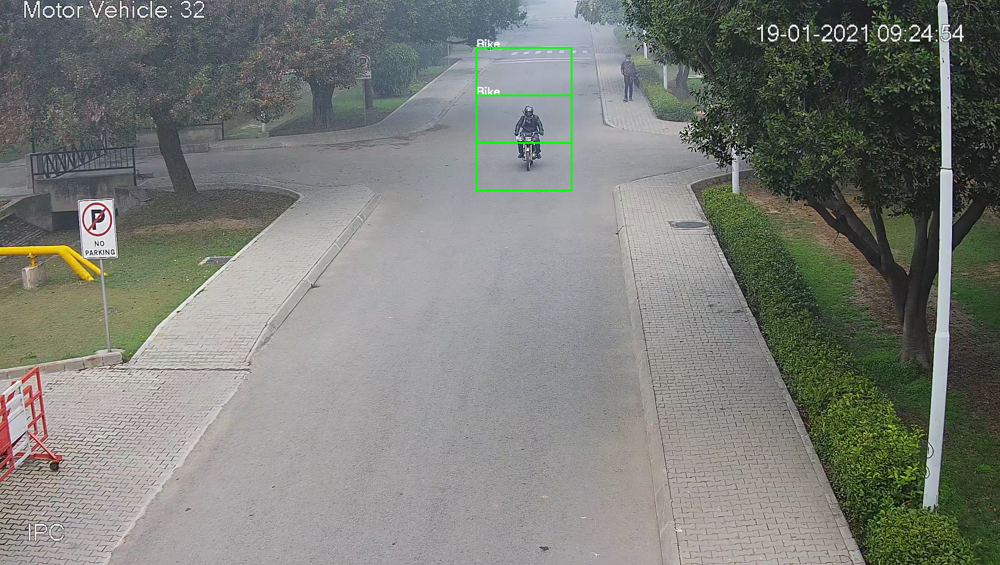

In [ ]:

cv2_imshow(video_frames_2[20])

In [ ]:
# !pip install scikit-video

import skvideo.io
  
# Writes the the output image sequences in a video file
skvideo.io.vwrite("video.mp4", video_frames[0:100])

     |████████████████████████████████| 2.3 MB 5.3 MB/s 


In [ ]:
skvideo.io.vwrite("video_2.mp4", video_frames_2[0:100])